In [136]:
! pip install statsmodels==0.13.2

In [137]:
! pip install --upgrade pip

In [138]:
import numpy as np
import os
import pandas as pd
import sqlite3
from scipy import stats
import matplotlib.pyplot as plt
import tarfile
import zipfile
from scipy.io import loadmat
from urllib.request import urlretrieve
from os.path import isfile, isdir
import plotly.express as px
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
%matplotlib inline
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import  mean_squared_error
from sklearn.metrics import mean_absolute_error

In [139]:
! pip install openpyxl

In [140]:
df = pd.read_excel("../doc/Prueba.xlsx")

In [141]:
df.describe(include = 'all')

,ESTU_TIPODOCUMENTO,ESTU_NACIONALIDAD,ESTU_GENERO,ESTU_FECHANACIMIENTO,ESTU_EXTERIOR,PERIODO,ESTU_CONSECUTIVO,ESTU_ESTUDIANTE,ESTU_PAIS_RESIDE,ESTU_DISC_FISICA,ESTU_DISC_SISTEM,ESTU_DISC_AUDITCASTELL,ESTU_DISC_AUDITLSC,ESTU_DISC_VISUALCEGUE,ESTU_DISC_VISUALBAJA,ESTU_DISC_VOZHABLA,ESTU_DISC_INTELEC,ESTU_DISC_ESPAUTISTA,ESTU_DISC_PSICOSOCIAL,ESTU_DISC_ASPERGER,ESTU_DEPTO_RESIDE,ESTU_COD_RESIDE_DEPTO,ESTU_MCPIO_RESIDE,ESTU_COD_RESIDE_MCPIO,ESTU_AREARESIDE,ESTU_ESTADOCIVIL,ESTU_COLE_TERMINO,ESTU_CODDANE_COLE_TERMINO,ESTU_COD_COLE_MCPIO_TERMINO,ESTU_OTROCOLE_TERMINO,ESTU_TITULOOBTENIDOBACHILLER,ESTU_PAGOMATRICULABECA,ESTU_PAGOMATRICULACREDITO,ESTU_PAGOMATRICULAPADRES,ESTU_PAGOMATRICULAPROPIO,ESTU_COMOCAPACITOEXAMENSB11,ESTU_TIPODOCUMENTOSB11,ESTU_SEMESTRECURSA,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_TRABAJOLABORPADRE,FAMI_TRABAJOLABORMADRE,FAMI_ESTRATOVIVIENDA,FAMI_TIENEINTERNET,FAMI_TIENESERVICIOTV,FAMI_TIENECOMPUTADOR,FAMI_TIENELAVADORA,FAMI_TIENEHORNOMICROOGAS,FAMI_TIENEAUTOMOVIL,FAMI_TIENEMOTOCICLETA,FAMI_TIENECONSOLAVIDEOJUEGOS,FAMI_CUANTOSCOMPARTEBAÑO,ESTU_VALORMATRICULAUNIVERSIDAD,ESTU_HORASSEMANATRABAJA,INST_COD_INSTITUCION,INST_NOMBRE_INSTITUCION,ESTU_PRGM_ACADEMICO,ESTU_SNIES_PRGMACADEMICO,GRUPOREFERENCIA,ESTU_PRGM_CODMUNICIPIO,ESTU_PRGM_MUNICIPIO,ESTU_PRGM_DEPARTAMENTO,ESTU_NIVEL_PRGM_ACADEMICO,ESTU_METODO_PRGM,ESTU_NUCLEO_PREGRADO,ESTU_INST_CODMUNICIPIO,ESTU_INST_MUNICIPIO,ESTU_INST_DEPARTAMENTO,INST_CARACTER_ACADEMICO,INST_ORIGEN,ESTU_PRIVADO_LIBERTAD,ESTU_COD_MCPIO_PRESENTACION,ESTU_MCPIO_PRESENTACION,ESTU_DEPTO_PRESENTACION,ESTU_COD_DEPTO_PRESENTACION,MOD_RAZONA_CUANTITAT_PUNT,MOD_RAZONA_CUANTITATIVO_PNAL,MOD_RAZONA_CUANTITATIVO_PNBC,MOD_LECTURA_CRITICA_PUNT,MOD_LECTURA_CRITICA_PNAL,MOD_LECTURA_CRITICA_PNBC,MOD_COMPETEN_CIUDADA_PUNT,MOD_COMPETEN_CIUDADA_PNAL,MOD_COMPETEN_CIUDADA_PNBC,MOD_INGLES_PUNT,MOD_INGLES_DESEM,MOD_INGLES_PNAL,MOD_INGLES_PNBC,MOD_COMUNI_ESCRITA_PUNT,MOD_COMUNI_ESCRITA_DESEM,MOD_COMUNI_ESCRITA_PNAL,MOD_COMUNI_ESCRITA_PNBC,PUNT_GLOBAL,PERCENTIL_GLOBAL,PERCENTIL_NBC,ESTU_ESTADOINVESTIGACION
count,68725,68725,68597,68667,68725,68725.0,68725,68725,68725,27,3,8,8,1,10,1,3,1,2,2,68688,68688.000000,68688,68688.00000,58499,58190,37609,3.760900e+04,37609.000000,11543,58465,58461,58461,58463,58461,58475,57799,58465.0,65210,65100,56760,60492,64573,64460,64325,64056,64006,63846,63817,63840,63783,63863,63706,63606,68725.000000,68725,68725,68661.000000,68725,68725.00000,68725,68725,68725,68725,68725,68725.000000,68725,68725,68725,68725,68725,68725.000000,68725,68725,68725.000000,68725.000000,68567.000000,68566.000000,68725.000000,68567.000000,68566.000000,68725.000000,68567.000000,68566.000000,68705.000000,52346,68567.000000,68566.000000,67851.000000,58108.000000,67696.000000,67695.000000,68725.000000,68567.000000,68566.000000,68725
unique,6,17,2,10735,1,NaN,68725,1,17,1,1,1,1,1,1,1,1,1,1,1,34,NaN,913,NaN,2,4,7201,NaN,NaN,9655,3,2,2,2,2,3,5,12.0,12,12,13,13,7,2,2,2,2,2,2,2,2,6,7,5,NaN,184,982,NaN,20,NaN,136,32,2,3,50,NaN,51,25,5,6,1,NaN,3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,CC,COLOMBIA,M,09/21/2000 12:00:00 AM,NO,NaN,EK202010002443,ESTUDIANTE,COLOMBIA,x,x,x,x,x,x,x,x,x,x,x,BOGOTÁ,NaN,BOGOTÁ D.C.,NaN,Cabecera Municipal,Soltero,INST EDUC CEFA,NaN,NaN,otro,Bachiller académico,No,No,No,No,Repasó por cuenta propia,TI,4.0,Primaria incompleta,Secundaria (Bachillerato) completa,Trabaja por cuenta propia (por ejemplo plomero...,"Trabaja en el hogar, no trabaja o estudia",Estrato 2,Si,Si,Si,Si,No,No,No,No,3 o 4,No pago semestre,Más de 30 horas,NaN,SERVICIO NACIONAL DE APRENDIZAJE-SENA,TECNOLOGÍA EN CONTABILIDAD Y FINANZAS,NaN,TECNOLÓGICO EN ADMINISTRACIÓN Y TURISMO,NaN,BOGOTÁ D.C.,BOGOTÁ,TECNOLOGÍA,PRESENCIAL,ADMINISTRACIÓN,NaN,BOGOTÁ D.C.,BOGOTÁ,INSTITUCIÓN TECNOLÓGICA,OFICIAL NACIONAL,N,NaN,BOGOTÁ D.C.,BOGOTÁ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PUBLICAR
freq,67218,68663,34798,45,68725,NaN,1,68725,68663,27,3,8,8,1,

In [142]:
corr = df.corr()
corr.style.background_gradient (cmap = 'coolwarm')

C:\Users\USER\AppData\Local\Temp\ipykernel_20192\4260025493.py:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

C:\Users\USER\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\io\formats\style.py:3931: RuntimeWarning:

All-NaN slice encountered

C:\Users\USER\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\io\formats\style.py:3932: RuntimeWarning:

All-NaN slice encountered



,PERIODO,ESTU_COD_RESIDE_DEPTO,ESTU_COD_RESIDE_MCPIO,ESTU_CODDANE_COLE_TERMINO,ESTU_COD_COLE_MCPIO_TERMINO,INST_COD_INSTITUCION,ESTU_SNIES_PRGMACADEMICO,ESTU_PRGM_CODMUNICIPIO,ESTU_INST_CODMUNICIPIO,ESTU_COD_MCPIO_PRESENTACION,ESTU_COD_DEPTO_PRESENTACION,MOD_RAZONA_CUANTITAT_PUNT,MOD_RAZONA_CUANTITATIVO_PNAL,MOD_RAZONA_CUANTITATIVO_PNBC,MOD_LECTURA_CRITICA_PUNT,MOD_LECTURA_CRITICA_PNAL,MOD_LECTURA_CRITICA_PNBC,MOD_COMPETEN_CIUDADA_PUNT,MOD_COMPETEN_CIUDADA_PNAL,MOD_COMPETEN_CIUDADA_PNBC,MOD_INGLES_PUNT,MOD_INGLES_PNAL,MOD_INGLES_PNBC,MOD_COMUNI_ESCRITA_PUNT,MOD_COMUNI_ESCRITA_DESEM,MOD_COMUNI_ESCRITA_PNAL,MOD_COMUNI_ESCRITA_PNBC,PUNT_GLOBAL,PERCENTIL_GLOBAL,PERCENTIL_NBC
PERIODO,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
ESTU_COD_RESIDE_DEPTO,nan,1.000000,0.053928,0.231330,0.857291,-0.014235,-0.008383,0.021562,0.017266,0.074151,0.074120,-0.003864,-0.004038,0.001104,-0.004871,-0.005798,-0.000314,-0.004790,-0.006196,-0.000690,0.001848,0.001710,0.006698,-0.002814,-0.002400,-0.003269,-0.002961,-0.003822,-0.004575,0.001130
ESTU_COD_RESIDE_MCPIO,nan,0.053928,1.000000,0.231104,0.857123,-0.114693,-0.035995,0.758552,0.450700,0.047138,0.047191,-0.049601,-0.049879,-0.030038,-0.067296,-0.069394,-0.045937,-0.052353,-0.056697,-0.036659,-0.052533,-0.063633,-0.035304,-0.025523,-0.043673,-0.038307,-0.031531,-0.066519,-0.067544,-0.042505
ESTU_CODDANE_COLE_TERMINO,nan,0.231330,0.231104,1.000000,0.261151,-0.081547,-0.024600,0.195089,0.135084,0.023002,0.022966,-0.009268,-0.012177,-0.006455,-0.009460,-0.011841,-0.006372,-0.006323,-0.006311,-0.000691,0.023098,0.019660,0.025409,-0.003219,-0.008255,-0.006625,-0.005773,-0.001221,-0.004482,0.001289
ESTU_COD_COLE_MCPIO_TERMINO,nan,0.857291,0.857123,0.261151,1.000000,-0.100356,-0.033236,0.742725,0.412567,0.038095,0.038108,-0.054986,-0.055359,-0.038196,-0.074158,-0.076156,-0.056074,-0.061641,-0.066054,-0.048105,-0.062758,-0.076604,-0.051997,-0.028615,-0.047745,-0.041394,-0.035484,-0.075700,-0.076554,-0.055062
INST_COD_INSTITUCION,nan,-0.014235,-0.114693,-0.081547,-0.100356,1.000000,0.520284,-0.089890,-0.403220,-0.101083,-0.100747,-0.055692,-0.051154,-0.077823,-0.037102,-0.036088,-0.064572,-0.050684,-0.050575,-0.076413,-0.055878,-0.054176,-0.079815,-0.051877,-0.090622,-0.080345,-0.072729,-0.072153,-0.071351,-0.096158
ESTU_SNIES_PRGMACADEMICO,nan,-0.008383,-0.035995,-0.024600,-0.033236,0.520284,1.000000,0.013724,-0.224671,-0.094652,-0.094003,-0.067126,-0.065084,-0.065278,-0.053109,-0.052244,-0.051102,-0.048295,-0.048686,-0.045964,-0.048742,-0.053082,-0.054224,-0.046879,-0.061944,-0.060936,-0.051848,-0.072888,-0.071726,-0.068596
ESTU_PRGM_CODMUNICIPIO,nan,0.021562,0.758552,0.195089,0.742725,-0.089890,0.013724,1.000000,0.514890,0.004031,0.004169,-0.040858,-0.041719,-0.025834,-0.062577,-0.063480,-0.042568,-0.049168,-0.053458,-0.034856,-0.044239,-0.055252,-0.028266,-0.026153,-0.047219,-0.040161,-0.031242,-0.060201,-0.061094,-0.037975
ESTU_INST_CODMUNICIPIO,nan,0.017266,0.450700,0.135084,0.412567,-0.403220,-0.224671,0.514890,1.000000,0.061264,0.061329,0.023904,0.023403,0.023832,0.000381,-0.000000,0.001431,0.003854,0.004624,0.003761,0.009521,0.008898,0.015929,0.015027,0.010840,0.016320,0.014155,0.015147,0.015544,0.015780
ESTU_COD_MCPIO_PRESENTACION,nan,0.074151,0.047138,0.023002,0.038095,-0.101083,-0.094652,0.004031,0.061264,1.000000,0.999992,-0.025097,-0.026213,0.032599,-0.043298,-0.048942,0.009990,-0.052651,-0.060215,-0.008184,-0.026076,-0.040573,0.016258,-0.001942,0.012541,0.005971,0.010122,-0.038355,-0.042674,0.017041


In [143]:
fig = px.box(df, x="ESTU_AREARESIDE", y="PUNT_GLOBAL")
fig.show()

<Axes: >

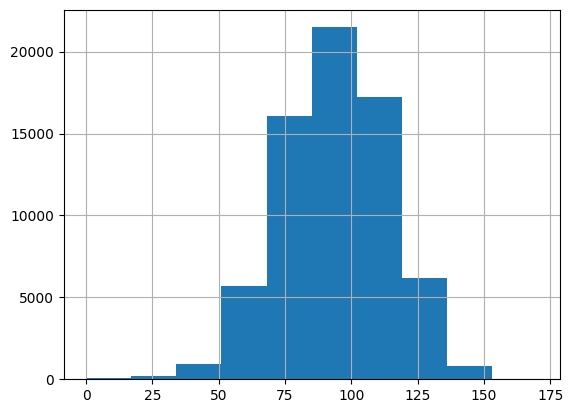

In [144]:
df.PUNT_GLOBAL.hist()

# Exploracion de datos
segun la matriz de correlacion, los más importantes son los puntajes que se obtubieron en las diferentes areas de la prueba, como ingles o razonamiento, pero estos no serán incluidos en el modelo, puesto que lo que deseamos es predecir el puntaje global acorde a las diferentes situaciones del estudiante

por otra parte hay otros medianeamente  significantes, como son el colegio donde terminó, la carrrera de la madre o del padre, el municipio donde vive  y el programa academico

### Se hace un cambio a la nacinalidad

In [145]:
df.loc[df['ESTU_NACIONALIDAD'] != 'COLOMBIA', 'ESTU_NACIONALIDAD'] = 'OTROS'

Se remueven las tablas que  veo que no son necesarias para el objetivo requerido

In [146]:
df2 = df.drop(['ESTU_DISC_AUDITCASTELL', 'ESTU_DISC_AUDITLSC','ESTU_DISC_VISUALCEGUE','ESTU_DISC_VISUALBAJA', 'ESTU_DISC_VOZHABLA', 'ESTU_DISC_INTELEC','ESTU_DISC_ESPAUTISTA','ESTU_DISC_PSICOSOCIAL', 'ESTU_DISC_ASPERGER',
               'ESTU_CONSECUTIVO','ESTU_ESTUDIANTE','ESTU_DISC_FISICA','ESTU_DISC_SISTEM', 'ESTU_CODDANE_COLE_TERMINO', 'ESTU_COD_COLE_MCPIO_TERMINO', 'ESTU_COD_RESIDE_MCPIO', 'INST_COD_INSTITUCION',
               'ESTU_SNIES_PRGMACADEMICO','ESTU_PRGM_CODMUNICIPIO', 'ESTU_INST_CODMUNICIPIO','ESTU_COD_MCPIO_PRESENTACION', 'ESTU_COD_DEPTO_PRESENTACION', 'MOD_RAZONA_CUANTITAT_PUNT', 'MOD_RAZONA_CUANTITATIVO_PNAL',
               'MOD_RAZONA_CUANTITATIVO_PNBC', 'MOD_LECTURA_CRITICA_PUNT', 'MOD_LECTURA_CRITICA_PNAL', 'MOD_LECTURA_CRITICA_PNBC', 'MOD_COMPETEN_CIUDADA_PUNT', 'MOD_COMPETEN_CIUDADA_PNAL', 'MOD_COMPETEN_CIUDADA_PNBC',
               'MOD_INGLES_PUNT', 'MOD_INGLES_DESEM', 'MOD_INGLES_PNAL', 'MOD_INGLES_PNBC', 'MOD_COMUNI_ESCRITA_PUNT', 'MOD_COMUNI_ESCRITA_DESEM', 'MOD_COMUNI_ESCRITA_PNAL', 'MOD_COMUNI_ESCRITA_PNBC',
               'PERCENTIL_GLOBAL', 'PERCENTIL_NBC', 'ESTU_COD_RESIDE_DEPTO', 'PERIODO', 'ESTU_GENERO', 'ESTU_EXTERIOR','ESTU_FECHANACIMIENTO','ESTU_MCPIO_RESIDE','ESTU_COLE_TERMINO','ESTU_OTROCOLE_TERMINO','INST_NOMBRE_INSTITUCION',
          'ESTU_PRGM_ACADEMICO','ESTU_PRGM_MUNICIPIO','ESTU_NUCLEO_PREGRADO',
          'ESTU_INST_MUNICIPIO'], axis=1)

se realiza la separacion de laas tablas que se ingregaaran como dummies
col son las tablas que serán ingresadas como dummies,  y aparte son tablas que tienen mucha varaibilidad de datos, las cuales serán modificadas más adelante

In [147]:
col = ['ESTU_TIPODOCUMENTO','ESTU_NACIONALIDAD',
       'ESTU_PAIS_RESIDE','ESTU_DEPTO_RESIDE','ESTU_AREARESIDE','ESTU_ESTADOCIVIL',
       'ESTU_TITULOOBTENIDOBACHILLER','ESTU_PAGOMATRICULABECA',
       'ESTU_PAGOMATRICULACREDITO','ESTU_PAGOMATRICULAPADRES','ESTU_PAGOMATRICULAPROPIO','ESTU_COMOCAPACITOEXAMENSB11'
       ,'ESTU_TIPODOCUMENTOSB11','ESTU_SEMESTRECURSA','FAMI_EDUCACIONPADRE','FAMI_EDUCACIONMADRE','FAMI_TRABAJOLABORPADRE',
       'FAMI_TRABAJOLABORMADRE','FAMI_ESTRATOVIVIENDA','FAMI_TIENEINTERNET','FAMI_TIENESERVICIOTV','FAMI_TIENECOMPUTADOR',
       'FAMI_TIENELAVADORA','FAMI_TIENEHORNOMICROOGAS','FAMI_TIENEAUTOMOVIL','FAMI_TIENEMOTOCICLETA','FAMI_TIENECONSOLAVIDEOJUEGOS',
       'FAMI_CUANTOSCOMPARTEBAÑO','ESTU_VALORMATRICULAUNIVERSIDAD','ESTU_HORASSEMANATRABAJA',
       'GRUPOREFERENCIA','ESTU_PRGM_DEPARTAMENTO','ESTU_NIVEL_PRGM_ACADEMICO','ESTU_METODO_PRGM',
       'ESTU_INST_DEPARTAMENTO','INST_CARACTER_ACADEMICO','INST_ORIGEN','ESTU_PRIVADO_LIBERTAD','ESTU_MCPIO_PRESENTACION'
       ,'ESTU_DEPTO_PRESENTACION','ESTU_ESTADOINVESTIGACION']
aparte = ['ESTU_FECHANACIMIENTO','ESTU_MCPIO_RESIDE','ESTU_COLE_TERMINO','ESTU_OTROCOLE_TERMINO','INST_NOMBRE_INSTITUCION',
          'ESTU_PRGM_ACADEMICO','ESTU_PRGM_MUNICIPIO','ESTU_NUCLEO_PREGRADO',
          'ESTU_INST_MUNICIPIO',]

# Se crean las dummies y se conquetan con el puntaje global

In [148]:
dummi_variables = pd.get_dummies(df2[col],prefix=col,dummy_na=True,drop_first=True)
df_entrnar = pd.concat((dummi_variables, df2[['PUNT_GLOBAL']]), axis=1)
df_entrnar.describe()

,ESTU_TIPODOCUMENTO_CE,ESTU_TIPODOCUMENTO_CR,ESTU_TIPODOCUMENTO_PE,ESTU_TIPODOCUMENTO_PEP,ESTU_TIPODOCUMENTO_TI,ESTU_TIPODOCUMENTO_nan,ESTU_NACIONALIDAD_OTROS,ESTU_NACIONALIDAD_nan,ESTU_PAIS_RESIDE_ANTIGUA Y BARBUDA,ESTU_PAIS_RESIDE_BOLIVIA,ESTU_PAIS_RESIDE_CANADÁ,ESTU_PAIS_RESIDE_CHILE,ESTU_PAIS_RESIDE_COLOMBIA,ESTU_PAIS_RESIDE_ECUADOR,ESTU_PAIS_RESIDE_EL SALVADOR,ESTU_PAIS_RESIDE_ESPAÑA,ESTU_PAIS_RESIDE_ESTADOS UNIDOS,ESTU_PAIS_RESIDE_HAITI,ESTU_PAIS_RESIDE_MÉXICO,ESTU_PAIS_RESIDE_NICARAGUA,ESTU_PAIS_RESIDE_PANAMÁ,ESTU_PAIS_RESIDE_PERÚ,ESTU_PAIS_RESIDE_REPÚBLICA DOMINICANA,ESTU_PAIS_RESIDE_VENEZUELA,ESTU_PAIS_RESIDE_nan,ESTU_DEPTO_RESIDE_ANTIOQUIA,ESTU_DEPTO_RESIDE_ARAUCA,ESTU_DEPTO_RESIDE_ATLANTICO,ESTU_DEPTO_RESIDE_BOGOTÁ,ESTU_DEPTO_RESIDE_BOLIVAR,ESTU_DEPTO_RESIDE_BOYACA,ESTU_DEPTO_RESIDE_CALDAS,ESTU_DEPTO_RESIDE_CAQUETA,ESTU_DEPTO_RESIDE_CASANARE,ESTU_DEPTO_RESIDE_CAUCA,ESTU_DEPTO_RESIDE_CESAR,ESTU_DEPTO_RESIDE_CHOCO,ESTU_DEPTO_RESIDE_CORDOBA,ESTU_DEPTO_RESIDE_CUNDINAMARCA,ESTU_DEPTO_RESIDE_EXTRANJERO,ESTU_DEPTO_RESIDE_GUAINIA,ESTU_DEPTO_RESIDE_GUAVIARE,ESTU_DEPTO_RESIDE_HUILA,ESTU_DEPTO_RESIDE_LA GUAJIRA,ESTU_DEPTO_RESIDE_MAGDALENA,ESTU_DEPTO_RESIDE_META,ESTU_DEPTO_RESIDE_NARIÑO,ESTU_DEPTO_RESIDE_NORTE SANTANDER,ESTU_DEPTO_RESIDE_PUTUMAYO,ESTU_DEPTO_RESIDE_QUINDIO,ESTU_DEPTO_RESIDE_RISARALDA,ESTU_DEPTO_RESIDE_SAN ANDRES,ESTU_DEPTO_RESIDE_SANTANDER,ESTU_DEPTO_RESIDE_SUCRE,ESTU_DEPTO_RESIDE_TOLIMA,ESTU_DEPTO_RESIDE_VALLE,ESTU_DEPTO_RESIDE_VAUPES,ESTU_DEPTO_RESIDE_VICHADA,ESTU_DEPTO_RESIDE_nan,ESTU_AREARESIDE_Cabecera Municipal,ESTU_AREARESIDE_nan,ESTU_ESTADOCIVIL_Separado y/o Viudo,ESTU_ESTADOCIVIL_Soltero,ESTU_ESTADOCIVIL_Unión libre,ESTU_ESTADOCIVIL_nan,ESTU_TITULOOBTENIDOBACHILLER_Bachiller pedagógico o normalista,ESTU_TITULOOBTENIDOBACHILLER_Bachiller técnico,ESTU_TITULOOBTENIDOBACHILLER_nan,ESTU_PAGOMATRICULABECA_Si,ESTU_PAGOMATRICULABECA_nan,ESTU_PAGOMATRICULACREDITO_Si,ESTU_PAGOMATRICULACREDITO_nan,ESTU_PAGOMATRICULAPADRES_Si,ESTU_PAGOMATRICULAPADRES_nan,ESTU_PAGOMATRICULAPROPIO_Si,ESTU_PAGOMATRICULAPROPIO_nan,ESTU_COMOCAPACITOEXAMENSB11_Repasó por cuenta propia,ESTU_COMOCAPACITOEXAMENSB11_Tomó un curso de preparación,ESTU_COMOCAPACITOEXAMENSB11_nan,ESTU_TIPODOCUMENTOSB11_CE,ESTU_TIPODOCUMENTOSB11_CR,ESTU_TIPODOCUMENTOSB11_PE,ESTU_TIPODOCUMENTOSB11_TI,ESTU_TIPODOCUMENTOSB11_nan,ESTU_SEMESTRECURSA_2,ESTU_SEMESTRECURSA_3,ESTU_SEMESTRECURSA_4,ESTU_SEMESTRECURSA_5,ESTU_SEMESTRECURSA_6,ESTU_SEMESTRECURSA_7,ESTU_SEMESTRECURSA_8,ESTU_SEMESTRECURSA_9,ESTU_SEMESTRECURSA_10,ESTU_SEMESTRECURSA_11,ESTU_SEMESTRECURSA_12 o más,ESTU_SEMESTRECURSA_nan,FAMI_EDUCACIONPADRE_Educación profesional incompleta,FAMI_EDUCACIONPADRE_Ninguno,FAMI_EDUCACIONPADRE_No Aplica,FAMI_EDUCACIONPADRE_No sabe,FAMI_EDUCACIONPADRE_Postgrado,FAMI_EDUCACIONPADRE_Primaria completa,FAMI_EDUCACIONPADRE_Primaria incompleta,FAMI_EDUCACIONPADRE_Secundaria (Bachillerato) completa,FAMI_EDUCACIONPADRE_Secundaria (Bachillerato) incompleta,FAMI_EDUCACIONPADRE_Técnica o tecnológica completa,FAMI_EDUCACIONPADRE_Técnica o tecnológica incompleta,FAMI_EDUCACIONPADRE_nan,FAMI_EDUCACIONMADRE_Educación profesional incompleta,FAMI_EDUCACIONMADRE_Ninguno,FAMI_EDUCACIONMADRE_No Aplica,FAMI_EDUCACIONMADRE_No sabe,FAMI_EDUCACIONMADRE_Postgrado,FAMI_EDUCACIONMADRE_Primaria completa,FAMI_EDUCACIONMADRE_Primaria incompleta,FAMI_EDUCACIONMADRE_Secundaria (Bachillerato) completa,FAMI_EDUCACIONMADRE_Secundaria (Bachillerato) incompleta,FAMI_EDUCACIONMADRE_Técnica o tecnológica completa,FAMI_EDUCACIONMADRE_Técnica o tecnológica incompleta,FAMI_EDUCACIONMADRE_nan,"FAMI_TRABAJOLABORPADRE_Es dueño de un negocio grande, tiene un cargo de nivel directivo o gerencial","FAMI_TRABAJOLABORPADRE_Es dueño de un negocio pequeño (tiene pocos empleados o no tiene, por ejemplo tienda, papelería, etc","FAMI_TRABAJOLABORPADRE_Es operario de máquinas o conduce vehículos (taxita, chofer)",FAMI_TRABAJOLABORPADRE_Es vendedor o trabaja en atención al público,FAMI_TRABAJOLABORPADRE_No aplica,FAMI_TRABAJOLABOR

### Se realiza el diagrama de correlacion con las dummies

In [179]:
corr = df_entrnar.corr()
corr.style.background_gradient (cmap = 'coolwarm')

C:\Users\USER\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\io\formats\style.py:3931: RuntimeWarning:

All-NaN slice encountered

C:\Users\USER\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\io\formats\style.py:3932: RuntimeWarning:

All-NaN slice encountered



# Aquí se hace la separacion de train y test

In [149]:
features =  list(set(df_entrnar.columns) - set(["PUNT_GLOBAL"]))
x = df_entrnar[features]
y = df_entrnar[["PUNT_GLOBAL"]]



In [150]:
x_train, x_test, y_train, y_test =train_test_split(x,y,test_size=0.2)

# Aqui se entrena el modelo base, luego haremos otro con las modificaciones a las tablas

In [151]:

x_test = sm.add_constant(x_test)
x_train = sm.add_constant(x_train)
model = sm.OLS(y_train,x_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            PUNT_GLOBAL   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.207
Method:                 Least Squares   F-statistic:                     54.64
Date:                Mon, 08 May 2023   Prob (F-statistic):               0.00
Time:                        11:31:23   Log-Likelihood:            -2.3639e+05
No. Observations:               54980   AIC:                         4.733e+05
Df Residuals:                   54711   BIC:                         4.757e+05
Df Model:                         268                                         
Covariance Type:            nonrobust                                         
                                                                                                                                  coef    std err          t      P>|t|      [0.025      0.975]
------------------

# Aqui realizamos  el caclulo del MSE para train y test y el MAPE


In [152]:

y_hat_train = model.predict(x_train)
y_hat_test = model.predict(x_test)
mse_train = mean_squared_error(y_train,y_hat_train)
mse_test = mean_squared_error(y_test,y_hat_test)
print(f"Error calculado en train y test: {mse_train}, {mse_test}")
mape = mean_absolute_error(y_train, y_hat_train)*100
print(" El Mape es:")
print(mape)

Error calculado en train y test: 317.78613239089873, 7.824884516201919e+17
 El Mape es:
1429.4271398116168


In [153]:
print(np.sqrt(mse_test))
print(np.sqrt(mse_train))

884583773.0934204
17.826556941566107


# SE realiza el segundo modelo


se hacen cambios a  la fecha  y demas valores como edad, el colegio donde el estudiante terminó y otros 

In [154]:
df["ESTU_FECHANACIMIENTO"].apply(lambda x: len(str(x))).value_counts()

22    41418
19    27249
3        58
Name: ESTU_FECHANACIMIENTO, dtype: int64

In [155]:
time = pd.Timestamp('now')
df['ESTU_EDAD']=(time - pd.to_datetime(df['ESTU_FECHANACIMIENTO'], errors="coerce")).astype('<m8[Y]')
df["ESTU_EDAD"].value_counts()

22.0     9211
23.0     8384
24.0     6388
25.0     4943
26.0     4233
21.0     3598
27.0     3584
28.0     3070
29.0     2753
30.0     2389
31.0     2086
32.0     1948
33.0     1851
34.0     1581
35.0     1372
36.0     1217
37.0     1122
38.0     1028
39.0      933
40.0      862
41.0      830
42.0      712
43.0      644
20.0      559
44.0      486
45.0      413
46.0      360
47.0      318
48.0      263
49.0      227
50.0      201
51.0      173
52.0      146
53.0      119
54.0      108
55.0       97
56.0       67
57.0       57
58.0       54
59.0       52
19.0       35
60.0       33
61.0       24
62.0       24
64.0       14
63.0       12
65.0        8
123.0       8
18.0        7
6.0         6
67.0        5
69.0        5
3.0         4
4.0         4
66.0        4
71.0        3
70.0        3
5.0         3
7.0         3
140.0       2
68.0        2
105.0       1
83.0        1
2.0         1
12.0        1
9.0         1
13.0        1
Name: ESTU_EDAD, dtype: int64

In [156]:
df2.describe(include = "all")

,ESTU_TIPODOCUMENTO,ESTU_NACIONALIDAD,ESTU_PAIS_RESIDE,ESTU_DEPTO_RESIDE,ESTU_AREARESIDE,ESTU_ESTADOCIVIL,ESTU_TITULOOBTENIDOBACHILLER,ESTU_PAGOMATRICULABECA,ESTU_PAGOMATRICULACREDITO,ESTU_PAGOMATRICULAPADRES,ESTU_PAGOMATRICULAPROPIO,ESTU_COMOCAPACITOEXAMENSB11,ESTU_TIPODOCUMENTOSB11,ESTU_SEMESTRECURSA,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_TRABAJOLABORPADRE,FAMI_TRABAJOLABORMADRE,FAMI_ESTRATOVIVIENDA,FAMI_TIENEINTERNET,FAMI_TIENESERVICIOTV,FAMI_TIENECOMPUTADOR,FAMI_TIENELAVADORA,FAMI_TIENEHORNOMICROOGAS,FAMI_TIENEAUTOMOVIL,FAMI_TIENEMOTOCICLETA,FAMI_TIENECONSOLAVIDEOJUEGOS,FAMI_CUANTOSCOMPARTEBAÑO,ESTU_VALORMATRICULAUNIVERSIDAD,ESTU_HORASSEMANATRABAJA,GRUPOREFERENCIA,ESTU_PRGM_DEPARTAMENTO,ESTU_NIVEL_PRGM_ACADEMICO,ESTU_METODO_PRGM,ESTU_INST_DEPARTAMENTO,INST_CARACTER_ACADEMICO,INST_ORIGEN,ESTU_PRIVADO_LIBERTAD,ESTU_MCPIO_PRESENTACION,ESTU_DEPTO_PRESENTACION,PUNT_GLOBAL,ESTU_ESTADOINVESTIGACION
count,68725,68725,68725,68688,58499,58190,58465,58461,58461,58463,58461,58475,57799,58465.0,65210,65100,56760,60492,64573,64460,64325,64056,64006,63846,63817,63840,63783,63863,63706,63606,68725,68725,68725,68725,68725,68725,68725,68725,68725,68725,68725.000000,68725
unique,6,2,17,34,2,4,3,2,2,2,2,3,5,12.0,12,12,13,13,7,2,2,2,2,2,2,2,2,6,7,5,20,32,2,3,25,5,6,1,3,3,NaN,2
top,CC,COLOMBIA,COLOMBIA,BOGOTÁ,Cabecera Municipal,Soltero,Bachiller académico,No,No,No,No,Repasó por cuenta propia,TI,4.0,Primaria incompleta,Secundaria (Bachillerato) completa,Trabaja por cuenta propia (por ejemplo plomero...,"Trabaja en el hogar, no trabaja o estudia",Estrato 2,Si,Si,Si,Si,No,No,No,No,3 o 4,No pago semestre,Más de 30 horas,TECNOLÓGICO EN ADMINISTRACIÓN Y TURISMO,BOGOTÁ,TECNOLOGÍA,PRESENCIAL,BOGOTÁ,INSTITUCIÓN TECNOLÓGICA,OFICIAL NACIONAL,N,BOGOTÁ D.C.,BOGOTÁ,NaN,PUBLICAR
freq,67218,68663,68663,19894,49073,45727,39880,48219,52463,42734,40894,42010,35827,22153.0,16636,16254,9853,29324,29672,56479,47240,55896,51383,38286,52603,39694,53110,30518,40140,26619,29267,24912,61358,60443,56978,49340,51598,68725,67962,67962,NaN,68350
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,93.195213,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.098347,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79.000000,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.000000,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.000000,NaN


In [157]:
df[['ESTU_NACIONALIDAD','PUNT_GLOBAL']].groupby('ESTU_NACIONALIDAD').agg(['count', 'mean'])

PUNT_GLOBAL            
                        count        mean
ESTU_NACIONALIDAD                        
COLOMBIA                68663   93.185471
OTROS                      62  103.983871

vemos que el genero no es muy influyente

In [158]:
df[['ESTU_DEPTO_RESIDE','PUNT_GLOBAL']].groupby('ESTU_DEPTO_RESIDE').agg(['count', 'mean'])

PUNT_GLOBAL           
                        count       mean
ESTU_DEPTO_RESIDE                       
AMAZONAS                   12  84.166667
ANTIOQUIA               10159  93.249040
ARAUCA                    102  87.637255
ATLANTICO                3032  89.537269
BOGOTÁ                  19894  98.118930
BOLIVAR                  3483  87.933391
BOYACA                   2078  90.835900
CALDAS                    952  91.475840
CAQUETA                   230  85.491304
CASANARE                  439  90.662870
CAUCA                    1069  87.526660
CESAR                    1085  85.330876
CHOCO                      94  77.085106
CORDOBA                   652  84.107362
CUNDINAMARCA             5649  94.648610
EXTRANJERO                  5  88.800000
GUAINIA                     4  77.750000
GUAVIARE                   78  85.564103
HUILA                    1618  87.360321
LA GUAJIRA                363  84.977961
MAGDALENA                 853  84.587339
META                     1230  89.861789
NARIÑO                    959  89.473410
NORTE SANTANDER          1532  89.840731
PUTUMAYO                  310  86.890323
QUINDIO                   891  92.003367
RISARALDA                1297  94.299923
SAN ANDRES                 19  90.000000
SANTANDER                3210  94.942679
SUCRE                     369  86.455285
TOLIMA                   2558  88.546130
VALLE                    4444  92.921242
VAUPES                      2  60.000000
VICHADA                    16  83.562500

debido al modelo anterior y a este analisis podemos ver que el municipio donde reside tampoco es muy influyente, excepto por vaupes, pero solo tienen

In [159]:
pandas_by_institution = df[['ESTU_COLE_TERMINO','PUNT_GLOBAL']].groupby('ESTU_COLE_TERMINO').agg(['count', 'mean'])

In [160]:
pandas_by_institution_a = df[['ESTU_COLE_TERMINO','PUNT_GLOBAL']].groupby('ESTU_COLE_TERMINO').count()
print(pandas_by_institution_a)

                                  PUNT_GLOBAL
ESTU_COLE_TERMINO                            
ABSALON TORRES CAMACHO                     16
ACAD CENTRAL DE SISTEMAS ACSI              10
ACAD LA SALLE SAN BENILDO                   4
ACAD MILIT MARISCAL SUCRE                   2
ACAD MILIT NAL HEROES GRANADINOS            3
...                                       ...
VENTIUN ANGELES (INST EDUC DIST)           11
VILLA CORELCA                               2
VILLA DE LOS ANDES                          3
VILLA DEL PRADO                             1
VILLALOSADA                                 1

[7201 rows x 1 columns]


In [161]:
escuelas_nuevas = list(pandas_by_institution_a.query("PUNT_GLOBAL>30").index)

In [162]:
df["New_School"] = df.ESTU_COLE_TERMINO.apply(lambda x: x if x in escuelas_nuevas else 'otros')

se transforma el colegio donde terminó

In [163]:
ix_mun = set([i for i,v, in zip(df["ESTU_MCPIO_RESIDE"].value_counts().index,df["ESTU_MCPIO_RESIDE"].value_counts().values) if v > 30])
df["ESTU_MCPIO_RESIDE_DE30"] = df["ESTU_MCPIO_RESIDE"].apply(lambda x: x if x in ix_mun else 'otros')
df["ESTU_MCPIO_RESIDE_DE30"].value_counts()

BOGOTÁ D.C.                    19894
otros                           5338
MEDELLÍN                        4617
CARTAGENA DE INDIAS             2843
CALI                            2227
SOACHA                          1777
IBAGUÉ                          1531
BARRANQUILLA                    1524
CÚCUTA                          1107
SOLEDAD                         1039
BUCARAMANGA                     1035
BELLO                           1001
VILLAVICENCIO                    905
PEREIRA                          730
VALLEDUPAR                       680
POPAYÁN                          679
ITAGÜÍ                           660
NEIVA                            631
ARMENIA                          606
SANTA MARTA                      540
MANIZALES                        539
BARRANCABERMEJA                  506
TUNJA                            482
ESPINAL                          478
FLORIDABLANCA                    462
SOGAMOSO                         442
CHÍA                             411
T

In [164]:
df["SEMESTRE"] = df['ESTU_SEMESTRECURSA'].apply(lambda x : 12 if x=="12 o más" else float(x))

In [165]:
numericos = ['PERIODO','SEMESTRE',"ESTU_EDAD", "PUNT_GLOBAL"]
col2 = ['ESTU_TIPODOCUMENTO','ESTU_NACIONALIDAD','ESTU_GENERO','FAMI_TRABAJOLABORPADRE','ESTU_ESTADOCIVIL','ESTU_DEPTO_RESIDE',
       'ESTU_PAIS_RESIDE','ESTU_DEPTO_RESIDE','ESTU_AREARESIDE','ESTU_ESTADOCIVIL','FAMI_EDUCACIONPADRE','FAMI_EDUCACIONMADRE',
       'ESTU_TITULOOBTENIDOBACHILLER','ESTU_PAGOMATRICULABECA',
       'ESTU_PAGOMATRICULACREDITO','ESTU_PAGOMATRICULAPADRES','ESTU_PAGOMATRICULAPROPIO','ESTU_COMOCAPACITOEXAMENSB11'
       ,'ESTU_TIPODOCUMENTOSB11','FAMI_EDUCACIONPADRE','FAMI_EDUCACIONMADRE','FAMI_TRABAJOLABORPADRE',
       'FAMI_TRABAJOLABORMADRE','FAMI_ESTRATOVIVIENDA','FAMI_TIENEINTERNET','FAMI_TIENESERVICIOTV','FAMI_TIENECOMPUTADOR',
       'FAMI_TIENELAVADORA','FAMI_TIENEHORNOMICROOGAS','FAMI_TIENEAUTOMOVIL','FAMI_TIENEMOTOCICLETA','FAMI_TIENECONSOLAVIDEOJUEGOS',
       'FAMI_CUANTOSCOMPARTEBAÑO','ESTU_VALORMATRICULAUNIVERSIDAD','ESTU_HORASSEMANATRABAJA',
       'GRUPOREFERENCIA','ESTU_PRGM_DEPARTAMENTO','ESTU_NIVEL_PRGM_ACADEMICO','ESTU_METODO_PRGM',
       'ESTU_INST_DEPARTAMENTO','INST_CARACTER_ACADEMICO','INST_ORIGEN','ESTU_PRIVADO_LIBERTAD','ESTU_MCPIO_PRESENTACION'
       ,'ESTU_DEPTO_PRESENTACION','ESTU_ESTADOINVESTIGACION', 'ESTU_MCPIO_RESIDE_DE30','New_School','ESTU_NUCLEO_PREGRADO','ESTU_PRGM_ACADEMICO','INST_ORIGEN',]
aparte = ['ESTU_FECHANACIMIENTO','ESTU_MCPIO_RESIDE','ESTU_COLE_TERMINO','ESTU_OTROCOLE_TERMINO','INST_NOMBRE_INSTITUCION',
          'ESTU_PRGM_ACADEMICO','ESTU_PRGM_MUNICIPIO','ESTU_NUCLEO_PREGRADO',
          'ESTU_INST_MUNICIPIO']


# Se crean las dummies  y se concatenan con las variables numericas

In [166]:
dummi_variables_2 = pd.get_dummies(df[col2],prefix=col2,dummy_na=True,drop_first=True)
df_tot = pd.concat((dummi_variables_2, df[numericos]), axis=1)
df_tot.describe()

,ESTU_TIPODOCUMENTO_CE,ESTU_TIPODOCUMENTO_CR,ESTU_TIPODOCUMENTO_PE,ESTU_TIPODOCUMENTO_PEP,ESTU_TIPODOCUMENTO_TI,ESTU_TIPODOCUMENTO_nan,ESTU_NACIONALIDAD_OTROS,ESTU_NACIONALIDAD_nan,ESTU_GENERO_M,ESTU_GENERO_nan,"FAMI_TRABAJOLABORPADRE_Es dueño de un negocio grande, tiene un cargo de nivel directivo o gerencial","FAMI_TRABAJOLABORPADRE_Es dueño de un negocio pequeño (tiene pocos empleados o no tiene, por ejemplo tienda, papelería, etc","FAMI_TRABAJOLABORPADRE_Es operario de máquinas o conduce vehículos (taxita, chofer)",FAMI_TRABAJOLABORPADRE_Es vendedor o trabaja en atención al público,FAMI_TRABAJOLABORPADRE_No aplica,FAMI_TRABAJOLABORPADRE_No sabe,FAMI_TRABAJOLABORPADRE_Pensionado,"FAMI_TRABAJOLABORPADRE_Tiene un trabajo de tipo auxiliar administrativo (por ejemplo, secretario o asistente)","FAMI_TRABAJOLABORPADRE_Trabaja como personal de limpieza, mantenimiento, seguridad o construcción","FAMI_TRABAJOLABORPADRE_Trabaja como profesional (por ejemplo médico, abogado, ingeniero)","FAMI_TRABAJOLABORPADRE_Trabaja en el hogar, no trabaja o estudia","FAMI_TRABAJOLABORPADRE_Trabaja por cuenta propia (por ejemplo plomero, electricista)",FAMI_TRABAJOLABORPADRE_nan,ESTU_ESTADOCIVIL_Separado y/o Viudo,ESTU_ESTADOCIVIL_Soltero,ESTU_ESTADOCIVIL_Unión libre,ESTU_ESTADOCIVIL_nan,ESTU_DEPTO_RESIDE_ANTIOQUIA,ESTU_DEPTO_RESIDE_ARAUCA,ESTU_DEPTO_RESIDE_ATLANTICO,ESTU_DEPTO_RESIDE_BOGOTÁ,ESTU_DEPTO_RESIDE_BOLIVAR,ESTU_DEPTO_RESIDE_BOYACA,ESTU_DEPTO_RESIDE_CALDAS,ESTU_DEPTO_RESIDE_CAQUETA,ESTU_DEPTO_RESIDE_CASANARE,ESTU_DEPTO_RESIDE_CAUCA,ESTU_DEPTO_RESIDE_CESAR,ESTU_DEPTO_RESIDE_CHOCO,ESTU_DEPTO_RESIDE_CORDOBA,ESTU_DEPTO_RESIDE_CUNDINAMARCA,ESTU_DEPTO_RESIDE_EXTRANJERO,ESTU_DEPTO_RESIDE_GUAINIA,ESTU_DEPTO_RESIDE_GUAVIARE,ESTU_DEPTO_RESIDE_HUILA,ESTU_DEPTO_RESIDE_LA GUAJIRA,ESTU_DEPTO_RESIDE_MAGDALENA,ESTU_DEPTO_RESIDE_META,ESTU_DEPTO_RESIDE_NARIÑO,ESTU_DEPTO_RESIDE_NORTE SANTANDER,ESTU_DEPTO_RESIDE_PUTUMAYO,ESTU_DEPTO_RESIDE_QUINDIO,ESTU_DEPTO_RESIDE_RISARALDA,ESTU_DEPTO_RESIDE_SAN ANDRES,ESTU_DEPTO_RESIDE_SANTANDER,ESTU_DEPTO_RESIDE_SUCRE,ESTU_DEPTO_RESIDE_TOLIMA,ESTU_DEPTO_RESIDE_VALLE,ESTU_DEPTO_RESIDE_VAUPES,ESTU_DEPTO_RESIDE_VICHADA,ESTU_DEPTO_RESIDE_nan,ESTU_PAIS_RESIDE_ANTIGUA Y BARBUDA,ESTU_PAIS_RESIDE_BOLIVIA,ESTU_PAIS_RESIDE_CANADÁ,ESTU_PAIS_RESIDE_CHILE,ESTU_PAIS_RESIDE_COLOMBIA,ESTU_PAIS_RESIDE_ECUADOR,ESTU_PAIS_RESIDE_EL SALVADOR,ESTU_PAIS_RESIDE_ESPAÑA,ESTU_PAIS_RESIDE_ESTADOS UNIDOS,ESTU_PAIS_RESIDE_HAITI,ESTU_PAIS_RESIDE_MÉXICO,ESTU_PAIS_RESIDE_NICARAGUA,ESTU_PAIS_RESIDE_PANAMÁ,ESTU_PAIS_RESIDE_PERÚ,ESTU_PAIS_RESIDE_REPÚBLICA DOMINICANA,ESTU_PAIS_RESIDE_VENEZUELA,ESTU_PAIS_RESIDE_nan,ESTU_DEPTO_RESIDE_ANTIOQUIA,ESTU_DEPTO_RESIDE_ARAUCA,ESTU_DEPTO_RESIDE_ATLANTICO,ESTU_DEPTO_RESIDE_BOGOTÁ,ESTU_DEPTO_RESIDE_BOLIVAR,ESTU_DEPTO_RESIDE_BOYACA,ESTU_DEPTO_RESIDE_CALDAS,ESTU_DEPTO_RESIDE_CAQUETA,ESTU_DEPTO_RESIDE_CASANARE,ESTU_DEPTO_RESIDE_CAUCA,ESTU_DEPTO_RESIDE_CESAR,ESTU_DEPTO_RESIDE_CHOCO,ESTU_DEPTO_RESIDE_CORDOBA,ESTU_DEPTO_RESIDE_CUNDINAMARCA,ESTU_DEPTO_RESIDE_EXTRANJERO,ESTU_DEPTO_RESIDE_GUAINIA,ESTU_DEPTO_RESIDE_GUAVIARE,ESTU_DEPTO_RESIDE_HUILA,ESTU_DEPTO_RESIDE_LA GUAJIRA,ESTU_DEPTO_RESIDE_MAGDALENA,ESTU_DEPTO_RESIDE_META,ESTU_DEPTO_RESIDE_NARIÑO,ESTU_DEPTO_RESIDE_NORTE SANTANDER,ESTU_DEPTO_RESIDE_PUTUMAYO,ESTU_DEPTO_RESIDE_QUINDIO,ESTU_DEPTO_RESIDE_RISARALDA,ESTU_DEPTO_RESIDE_SAN ANDRES,ESTU_DEPTO_RESIDE_SANTANDER,ESTU_DEPTO_RESIDE_SUCRE,ESTU_DEPTO_RESIDE_TOLIMA,ESTU_DEPTO_RESIDE_VALLE,ESTU_DEPTO_RESIDE_VAUPES,ESTU_DEPTO_RESIDE_VICHADA,ESTU_DEPTO_RESIDE_nan,ESTU_AREARESIDE_Cabecera Municipal,ESTU_AREARESIDE_nan,ESTU_ESTADOCIVIL_Separado y/o Viudo,ESTU_ESTADOCIVIL_Soltero,ESTU_ESTADOCIVIL_Unión libre,ESTU_ESTADOCIVIL_nan,FAMI_EDUCACIONPADRE_Educación profesional incompleta,FAMI_EDUCACIONPADRE_Ninguno,FAMI_EDUCACIONPADRE_No Aplica,FAMI_EDUCACIONPADRE_No sabe,FAMI_EDUCACIONPADRE_Postgrado,FAMI_EDUCACIONPADRE_Primaria completa,FAMI_EDUCACIONPADRE_Primaria incompleta,FAMI_EDUCACIONPADRE_Secundaria (Bachillerato) completa,FAMI_EDUCAC

In [180]:
corr = df_tot.corr()
corr.style.background_gradient (cmap = 'coolwarm')

KeyError: '`Styler.apply` and `.applymap` are not compatible with non-unique index or columns.'

In [167]:
features =  list(set(df_tot.columns) - set(["PUNT_GLOBAL"]))
x_2 = df_tot[features].fillna(0)
y_2 = df_tot[["PUNT_GLOBAL"]]


In [168]:
x_train, x_test, y_train, y_test =train_test_split(x_2,y_2,test_size=0.2)

# Se entrena el modelo 
y como se puee ver el R squared subió un poco y el mse bajo un poco el error

In [169]:
x_test = sm.add_constant(x_test)
x_train = sm.add_constant(x_train)
model = sm.OLS(y_train,x_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            PUNT_GLOBAL   R-squared:                       0.249
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                     11.84
Date:                Mon, 08 May 2023   Prob (F-statistic):               0.00
Time:                        11:32:07   Log-Likelihood:            -2.3509e+05
No. Observations:               54980   AIC:                         4.732e+05
Df Residuals:                   53482   BIC:                         4.865e+05
Df Model:                        1497                                         
Covariance Type:            nonrobust                                         
                                                                                                                                                 coef    std err          t      P>|t|      [0.025      0.975]
---

# Se calcula el MSE y el MAPE

### segun el error en train y en teste, se descrubre  que el error es casi el mismo, por lo que se puede decir que el modelo aprendió bien de el train y se ve que el error en teste es mas bajo que en train

In [170]:

y_hat_train = model.predict(x_train)
y_hat_test = model.predict(x_test)
mse_train = mean_squared_error(y_train,y_hat_train)
mse_test = mean_squared_error(y_test,y_hat_test)
print(f"Error calculado en train y test: {mse_train}, {mse_test}")
mape = mean_absolute_error(y_train, y_hat_train)*100
print(" El Mape es:")
print(mape)

Error calculado en train y test: 303.02006098562424, 317.8989031287308
 El Mape es:
1390.8583911743815


In [171]:
print(np.sqrt(mse_test))
print(np.sqrt(mse_train))

17.82971965928603
17.40747141274758


In [172]:
df.describe(include = 'all')

,ESTU_TIPODOCUMENTO,ESTU_NACIONALIDAD,ESTU_GENERO,ESTU_FECHANACIMIENTO,ESTU_EXTERIOR,PERIODO,ESTU_CONSECUTIVO,ESTU_ESTUDIANTE,ESTU_PAIS_RESIDE,ESTU_DISC_FISICA,ESTU_DISC_SISTEM,ESTU_DISC_AUDITCASTELL,ESTU_DISC_AUDITLSC,ESTU_DISC_VISUALCEGUE,ESTU_DISC_VISUALBAJA,ESTU_DISC_VOZHABLA,ESTU_DISC_INTELEC,ESTU_DISC_ESPAUTISTA,ESTU_DISC_PSICOSOCIAL,ESTU_DISC_ASPERGER,ESTU_DEPTO_RESIDE,ESTU_COD_RESIDE_DEPTO,ESTU_MCPIO_RESIDE,ESTU_COD_RESIDE_MCPIO,ESTU_AREARESIDE,ESTU_ESTADOCIVIL,ESTU_COLE_TERMINO,ESTU_CODDANE_COLE_TERMINO,ESTU_COD_COLE_MCPIO_TERMINO,ESTU_OTROCOLE_TERMINO,ESTU_TITULOOBTENIDOBACHILLER,ESTU_PAGOMATRICULABECA,ESTU_PAGOMATRICULACREDITO,ESTU_PAGOMATRICULAPADRES,ESTU_PAGOMATRICULAPROPIO,ESTU_COMOCAPACITOEXAMENSB11,ESTU_TIPODOCUMENTOSB11,ESTU_SEMESTRECURSA,FAMI_EDUCACIONPADRE,FAMI_EDUCACIONMADRE,FAMI_TRABAJOLABORPADRE,FAMI_TRABAJOLABORMADRE,FAMI_ESTRATOVIVIENDA,FAMI_TIENEINTERNET,FAMI_TIENESERVICIOTV,FAMI_TIENECOMPUTADOR,FAMI_TIENELAVADORA,FAMI_TIENEHORNOMICROOGAS,FAMI_TIENEAUTOMOVIL,FAMI_TIENEMOTOCICLETA,FAMI_TIENECONSOLAVIDEOJUEGOS,FAMI_CUANTOSCOMPARTEBAÑO,ESTU_VALORMATRICULAUNIVERSIDAD,ESTU_HORASSEMANATRABAJA,INST_COD_INSTITUCION,INST_NOMBRE_INSTITUCION,ESTU_PRGM_ACADEMICO,ESTU_SNIES_PRGMACADEMICO,GRUPOREFERENCIA,ESTU_PRGM_CODMUNICIPIO,ESTU_PRGM_MUNICIPIO,ESTU_PRGM_DEPARTAMENTO,ESTU_NIVEL_PRGM_ACADEMICO,ESTU_METODO_PRGM,ESTU_NUCLEO_PREGRADO,ESTU_INST_CODMUNICIPIO,ESTU_INST_MUNICIPIO,ESTU_INST_DEPARTAMENTO,INST_CARACTER_ACADEMICO,INST_ORIGEN,ESTU_PRIVADO_LIBERTAD,ESTU_COD_MCPIO_PRESENTACION,ESTU_MCPIO_PRESENTACION,ESTU_DEPTO_PRESENTACION,ESTU_COD_DEPTO_PRESENTACION,MOD_RAZONA_CUANTITAT_PUNT,MOD_RAZONA_CUANTITATIVO_PNAL,MOD_RAZONA_CUANTITATIVO_PNBC,MOD_LECTURA_CRITICA_PUNT,MOD_LECTURA_CRITICA_PNAL,MOD_LECTURA_CRITICA_PNBC,MOD_COMPETEN_CIUDADA_PUNT,MOD_COMPETEN_CIUDADA_PNAL,MOD_COMPETEN_CIUDADA_PNBC,MOD_INGLES_PUNT,MOD_INGLES_DESEM,MOD_INGLES_PNAL,MOD_INGLES_PNBC,MOD_COMUNI_ESCRITA_PUNT,MOD_COMUNI_ESCRITA_DESEM,MOD_COMUNI_ESCRITA_PNAL,MOD_COMUNI_ESCRITA_PNBC,PUNT_GLOBAL,PERCENTIL_GLOBAL,PERCENTIL_NBC,ESTU_ESTADOINVESTIGACION,ESTU_EDAD,New_School,ESTU_MCPIO_RESIDE_DE30,SEMESTRE
count,68725,68725,68597,68667,68725,68725.0,68725,68725,68725,27,3,8,8,1,10,1,3,1,2,2,68688,68688.000000,68688,68688.00000,58499,58190,37609,3.760900e+04,37609.000000,11543,58465,58461,58461,58463,58461,58475,57799,58465.0,65210,65100,56760,60492,64573,64460,64325,64056,64006,63846,63817,63840,63783,63863,63706,63606,68725.000000,68725,68725,68661.000000,68725,68725.00000,68725,68725,68725,68725,68725,68725.000000,68725,68725,68725,68725,68725,68725.000000,68725,68725,68725.000000,68725.000000,68567.000000,68566.000000,68725.000000,68567.000000,68566.000000,68725.000000,68567.000000,68566.000000,68705.000000,52346,68567.000000,68566.000000,67851.000000,58108.000000,67696.000000,67695.000000,68725.000000,68567.000000,68566.000000,68725,68654.000000,68725,68725,58465.00000
unique,6,2,2,10735,1,NaN,68725,1,17,1,1,1,1,1,1,1,1,1,1,1,34,NaN,913,NaN,2,4,7201,NaN,NaN,9655,3,2,2,2,2,3,5,12.0,12,12,13,13,7,2,2,2,2,2,2,2,2,6,7,5,NaN,184,982,NaN,20,NaN,136,32,2,3,50,NaN,51,25,5,6,1,NaN,3,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,NaN,100,167,NaN
top,CC,COLOMBIA,M,09/21/2000 12:00:00 AM,NO,NaN,EK202010002443,ESTUDIANTE,COLOMBIA,x,x,x,x,x,x,x,x,x,x,x,BOGOTÁ,NaN,BOGOTÁ D.C.,NaN,Cabecera Municipal,Soltero,INST EDUC CEFA,NaN,NaN,otro,Bachiller académico,No,No,No,No,Repasó por cuenta propia,TI,4.0,Primaria incompleta,Secundaria (Bachillerato) completa,Trabaja por cuenta propia (por ejemplo plomero...,"Trabaja en el hogar, no trabaja o estudia",Estrato 2,Si,Si,Si,Si,No,No,No,No,3 o 4,No pago semestre,Más de 30 horas,NaN,SERVICIO NACIONAL DE APRENDIZAJE-SENA,TECNOLOGÍA EN CONTABILIDAD Y FINANZAS,NaN,TECNOLÓGICO EN ADMINISTRACIÓN Y TURISMO,NaN,BOGOTÁ D.C.,BOGOTÁ,TECNOLOGÍA,PRESENCIAL,ADMINISTRACIÓN,NaN,BOGOTÁ D.C.,BOGOTÁ,INSTITUCIÓN TECNOLÓGICA,OFICIAL NACIONAL,N,NaN,BOGOTÁ D.C.,BOGOTÁ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,A1,N

# Quitar los valores más significaivos y comparar

In [173]:
numericos3 = ["PUNT_GLOBAL"]
col3 = ['ESTU_TIPODOCUMENTO','ESTU_NACIONALIDAD','ESTU_GENERO','ESTU_ESTADOCIVIL',
       'ESTU_PAIS_RESIDE','ESTU_DEPTO_RESIDE','ESTU_AREARESIDE','ESTU_ESTADOCIVIL',
       'ESTU_PAGOMATRICULABECA',
       'ESTU_PAGOMATRICULACREDITO','ESTU_PAGOMATRICULAPADRES','ESTU_PAGOMATRICULAPROPIO','ESTU_COMOCAPACITOEXAMENSB11'
       ,'ESTU_TIPODOCUMENTOSB11','FAMI_TIENESERVICIOTV','FAMI_TIENECOMPUTADOR',
       'FAMI_TIENELAVADORA','FAMI_TIENEHORNOMICROOGAS','FAMI_TIENEAUTOMOVIL','FAMI_TIENEMOTOCICLETA','FAMI_TIENECONSOLAVIDEOJUEGOS',
       'FAMI_CUANTOSCOMPARTEBAÑO','ESTU_VALORMATRICULAUNIVERSIDAD','ESTU_HORASSEMANATRABAJA',
       'GRUPOREFERENCIA','ESTU_PRGM_DEPARTAMENTO','ESTU_NIVEL_PRGM_ACADEMICO','ESTU_METODO_PRGM',
       'ESTU_INST_DEPARTAMENTO','INST_CARACTER_ACADEMICO','INST_ORIGEN','ESTU_PRIVADO_LIBERTAD','ESTU_MCPIO_PRESENTACION'
       ,'ESTU_DEPTO_PRESENTACION','INST_ORIGEN',]


In [174]:
dummi_variables_3 = pd.get_dummies(df[col3],prefix=col3,dummy_na=True,drop_first=True)
df_tot_2 = pd.concat((dummi_variables_3, df[numericos3]), axis=1)
df_tot_2.describe()

,ESTU_TIPODOCUMENTO_CE,ESTU_TIPODOCUMENTO_CR,ESTU_TIPODOCUMENTO_PE,ESTU_TIPODOCUMENTO_PEP,ESTU_TIPODOCUMENTO_TI,ESTU_TIPODOCUMENTO_nan,ESTU_NACIONALIDAD_OTROS,ESTU_NACIONALIDAD_nan,ESTU_GENERO_M,ESTU_GENERO_nan,ESTU_ESTADOCIVIL_Separado y/o Viudo,ESTU_ESTADOCIVIL_Soltero,ESTU_ESTADOCIVIL_Unión libre,ESTU_ESTADOCIVIL_nan,ESTU_PAIS_RESIDE_ANTIGUA Y BARBUDA,ESTU_PAIS_RESIDE_BOLIVIA,ESTU_PAIS_RESIDE_CANADÁ,ESTU_PAIS_RESIDE_CHILE,ESTU_PAIS_RESIDE_COLOMBIA,ESTU_PAIS_RESIDE_ECUADOR,ESTU_PAIS_RESIDE_EL SALVADOR,ESTU_PAIS_RESIDE_ESPAÑA,ESTU_PAIS_RESIDE_ESTADOS UNIDOS,ESTU_PAIS_RESIDE_HAITI,ESTU_PAIS_RESIDE_MÉXICO,ESTU_PAIS_RESIDE_NICARAGUA,ESTU_PAIS_RESIDE_PANAMÁ,ESTU_PAIS_RESIDE_PERÚ,ESTU_PAIS_RESIDE_REPÚBLICA DOMINICANA,ESTU_PAIS_RESIDE_VENEZUELA,ESTU_PAIS_RESIDE_nan,ESTU_DEPTO_RESIDE_ANTIOQUIA,ESTU_DEPTO_RESIDE_ARAUCA,ESTU_DEPTO_RESIDE_ATLANTICO,ESTU_DEPTO_RESIDE_BOGOTÁ,ESTU_DEPTO_RESIDE_BOLIVAR,ESTU_DEPTO_RESIDE_BOYACA,ESTU_DEPTO_RESIDE_CALDAS,ESTU_DEPTO_RESIDE_CAQUETA,ESTU_DEPTO_RESIDE_CASANARE,ESTU_DEPTO_RESIDE_CAUCA,ESTU_DEPTO_RESIDE_CESAR,ESTU_DEPTO_RESIDE_CHOCO,ESTU_DEPTO_RESIDE_CORDOBA,ESTU_DEPTO_RESIDE_CUNDINAMARCA,ESTU_DEPTO_RESIDE_EXTRANJERO,ESTU_DEPTO_RESIDE_GUAINIA,ESTU_DEPTO_RESIDE_GUAVIARE,ESTU_DEPTO_RESIDE_HUILA,ESTU_DEPTO_RESIDE_LA GUAJIRA,ESTU_DEPTO_RESIDE_MAGDALENA,ESTU_DEPTO_RESIDE_META,ESTU_DEPTO_RESIDE_NARIÑO,ESTU_DEPTO_RESIDE_NORTE SANTANDER,ESTU_DEPTO_RESIDE_PUTUMAYO,ESTU_DEPTO_RESIDE_QUINDIO,ESTU_DEPTO_RESIDE_RISARALDA,ESTU_DEPTO_RESIDE_SAN ANDRES,ESTU_DEPTO_RESIDE_SANTANDER,ESTU_DEPTO_RESIDE_SUCRE,ESTU_DEPTO_RESIDE_TOLIMA,ESTU_DEPTO_RESIDE_VALLE,ESTU_DEPTO_RESIDE_VAUPES,ESTU_DEPTO_RESIDE_VICHADA,ESTU_DEPTO_RESIDE_nan,ESTU_AREARESIDE_Cabecera Municipal,ESTU_AREARESIDE_nan,ESTU_ESTADOCIVIL_Separado y/o Viudo,ESTU_ESTADOCIVIL_Soltero,ESTU_ESTADOCIVIL_Unión libre,ESTU_ESTADOCIVIL_nan,ESTU_PAGOMATRICULABECA_Si,ESTU_PAGOMATRICULABECA_nan,ESTU_PAGOMATRICULACREDITO_Si,ESTU_PAGOMATRICULACREDITO_nan,ESTU_PAGOMATRICULAPADRES_Si,ESTU_PAGOMATRICULAPADRES_nan,ESTU_PAGOMATRICULAPROPIO_Si,ESTU_PAGOMATRICULAPROPIO_nan,ESTU_COMOCAPACITOEXAMENSB11_Repasó por cuenta propia,ESTU_COMOCAPACITOEXAMENSB11_Tomó un curso de preparación,ESTU_COMOCAPACITOEXAMENSB11_nan,ESTU_TIPODOCUMENTOSB11_CE,ESTU_TIPODOCUMENTOSB11_CR,ESTU_TIPODOCUMENTOSB11_PE,ESTU_TIPODOCUMENTOSB11_TI,ESTU_TIPODOCUMENTOSB11_nan,FAMI_TIENESERVICIOTV_Si,FAMI_TIENESERVICIOTV_nan,FAMI_TIENECOMPUTADOR_Si,FAMI_TIENECOMPUTADOR_nan,FAMI_TIENELAVADORA_Si,FAMI_TIENELAVADORA_nan,FAMI_TIENEHORNOMICROOGAS_Si,FAMI_TIENEHORNOMICROOGAS_nan,FAMI_TIENEAUTOMOVIL_Si,FAMI_TIENEAUTOMOVIL_nan,FAMI_TIENEMOTOCICLETA_Si,FAMI_TIENEMOTOCICLETA_nan,FAMI_TIENECONSOLAVIDEOJUEGOS_Si,FAMI_TIENECONSOLAVIDEOJUEGOS_nan,FAMI_CUANTOSCOMPARTEBAÑO_2,FAMI_CUANTOSCOMPARTEBAÑO_3 o 4,FAMI_CUANTOSCOMPARTEBAÑO_5 o 6,FAMI_CUANTOSCOMPARTEBAÑO_MAS DE 6,FAMI_CUANTOSCOMPARTEBAÑO_NINGUNA,FAMI_CUANTOSCOMPARTEBAÑO_nan,ESTU_VALORMATRICULAUNIVERSIDAD_Entre 5 y 7 millones,ESTU_VALORMATRICULAUNIVERSIDAD_Entre 500 mil y un millon de pesos,ESTU_VALORMATRICULAUNIVERSIDAD_Entre un millon y 3 millones de pesose,ESTU_VALORMATRICULAUNIVERSIDAD_Mas de 7 millones,ESTU_VALORMATRICULAUNIVERSIDAD_Menos de 500 mil pesos,ESTU_VALORMATRICULAUNIVERSIDAD_No pago semestre,ESTU_VALORMATRICULAUNIVERSIDAD_nan,ESTU_HORASSEMANATRABAJA_Entre 11 y 20 horas,ESTU_HORASSEMANATRABAJA_Entre 21 y 30 horas,ESTU_HORASSEMANATRABAJA_Menos de 10 horas,ESTU_HORASSEMANATRABAJA_Más de 30 horas,ESTU_HORASSEMANATRABAJA_nan,GRUPOREFERENCIA_GRUPO NACIONAL SENA-NO CLASIFICADOS,GRUPOREFERENCIA_NORMALES SUPERIORES,GRUPOREFERENCIA_PONAL PATRULLEROS,GRUPOREFERENCIA_RECREACIÓN Y DEPORTES,GRUPOREFERENCIA_RECREACIÓN Y DEPORTES TYT,GRUPOREFERENCIA_TECNOLÓGICO EN ADMINISTRACIÓN Y TURISMO,GRUPOREFERENCIA_TECNOLÓGICO EN ARTES - DISEÑO - COMUNICACIÓN,GRUPOREFERENCIA_TECNOLÓGICO EN CIENCIAS AGROPECUARIAS,"GRUPOREFERENCIA_TECNOLÓGICO EN INGENIERÍA, INDUSTRIA Y MINAS",GRUPOREFERENCIA_TECNOLÓGICO EN JUDICIAL,GRUPOREFERENCIA_TECNOLÓGICO EN MILITAR Y POLICIAL,GRUPOREFERENCIA_TECNOLÓGI

In [175]:
features =  list(set(df_tot_2.columns) - set(["PUNT_GLOBAL"]))
x_2 = df_tot_2[features].fillna(0)
y_2 = df_tot_2[["PUNT_GLOBAL"]]

In [176]:
x_train, x_test, y_train, y_test =train_test_split(x_2,y_2,test_size=0.2)

In [177]:
x_test = sm.add_constant(x_test)
x_train = sm.add_constant(x_train)
model = sm.OLS(y_train,x_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            PUNT_GLOBAL   R-squared:                       0.182
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     61.67
Date:                Mon, 08 May 2023   Prob (F-statistic):               0.00
Time:                        11:32:12   Log-Likelihood:            -2.3746e+05
No. Observations:               54980   AIC:                         4.753e+05
Df Residuals:                   54782   BIC:                         4.771e+05
Df Model:                         197                                         
Covariance Type:            nonrobust                                         
                                                                            coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

In [178]:
y_hat_train = model.predict(x_train)
y_hat_test = model.predict(x_test)
mse_train = mean_squared_error(y_train,y_hat_train)
mse_test = mean_squared_error(y_test,y_hat_test)
print(f"Error calculado en train y test: {mse_train}, {mse_test}")
mape = mean_absolute_error(y_train, y_hat_train)*100
print(" El Mape es:")
print(mape)

Error calculado en train y test: 330.3738378303563, 290298328811941.44
 El Mape es:
1456.6598286112119


### se nota como al quitar las tablas mas significativas el r squared se reduce  y el error aumenta un poco

# Describa en palabras que dice el modelo cuales son los principales hallazgos.

Me parece que el modelo no estuvo mal, de los principales hallazgos son que las perssonas que se prepararon les va un poco más mal, uno de los factores mas importantes son los estudios de la madre, del padre, el colegio donde terminaron, el estrato tambien era influyente, el municipio donde vive, entre otros
considero que seria un mejor modelo si se incoorporaran datos como el promedio del estudiante, las notas en el colegio, o el promedio ponderado de las difentes insituticones en la prueba